## Importing required libraries

In [1]:
import os
import torch
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler, random_split
from torchvision import transforms
from PIL import Image
from os import listdir
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.image import imread
from sklearn.model_selection import train_test_split


## Checking Availability of GPU

In [2]:
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")



True
Tesla T4


## Exploring the Data Structure of Train Dataset

In [3]:
DATA_ROOT_DIR = r"/kaggle/input/breast-cancer-images/breast cancer images/breast cancer images/IDC_regular_ps50_idx5"
files = listdir(DATA_ROOT_DIR )
print(len(files))
files[0:10]

279


['10295',
 '10304',
 '12868',
 '10274',
 '12818',
 '14190',
 '12869',
 '9323',
 '10291',
 '12906']

In [4]:
total_images = 0
for n in range(len(files)):
    patient_id = files[n]
    for c in [0, 1]:
        patient_path = DATA_ROOT_DIR + "/" + patient_id
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = listdir(class_path)
        total_images += len(subfiles)

total_images

277524

In [5]:
train_data = pd.DataFrame(index=np.arange(0, total_images), columns=["patient_id", "path", "target"])

k = 0
for n in range(len(files)):
    patient_id = files[n]
    patient_path = DATA_ROOT_DIR + "/" + patient_id 
    for c in [0,1]:
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = listdir(class_path)
        for m in range(len(subfiles)):
            image_path = subfiles[m]
            train_data.loc[k, "path"] = class_path + image_path
            train_data.loc[k, "target"] = c
            train_data.loc[k, "patient_id"] = patient_id
            k += 1  

train_data.head()

,patient_id,path,target
0,10295,/kaggle/input/breast-cancer-images/breast canc...,0
1,10295,/kaggle/input/breast-cancer-images/breast canc...,0
2,10295,/kaggle/input/breast-cancer-images/breast canc...,0
3,10295,/kaggle/input/breast-cancer-images/breast canc...,0
4,10295,/kaggle/input/breast-cancer-images/breast canc...,0


## Clean train_data

In [6]:
train_data = train_data[['path', 'target']].copy()
train_data['path'] = train_data['path'].astype(str)
train_data['target'] = train_data['target'].astype(int)

train_data = train_data.dropna(subset=['path', 'target'])


In [7]:
pos_selection = np.random.choice(train_data[train_data.target==1].index.values, size=50, replace=False)
neg_selection = np.random.choice(train_data[train_data.target==0].index.values, size=50, replace=False)

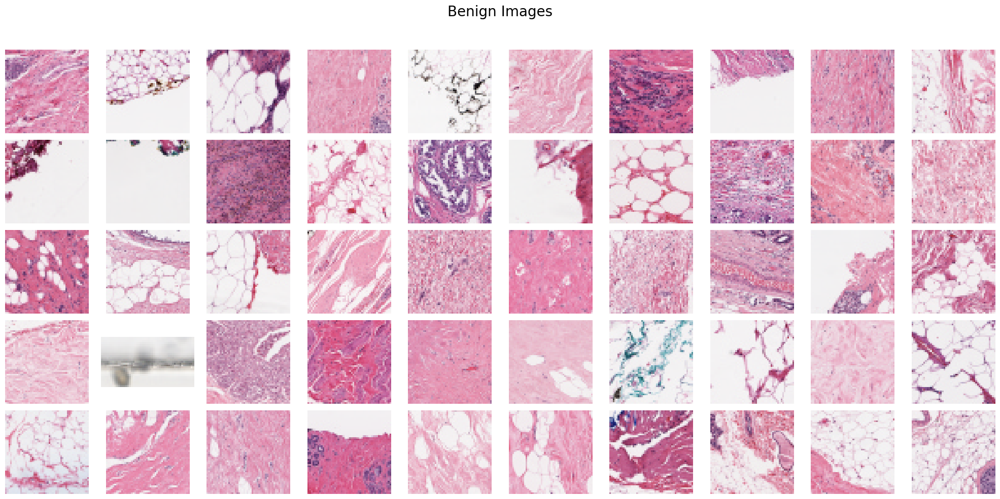

In [8]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

fig.suptitle("Benign Images", fontsize=20)  

for n in range(5):
    for m in range(10):
        idx = neg_selection[m + 10*n]
        image = imread(train_data.loc[idx, "path"])
        ax[n, m].imshow(image)
        ax[n, m].grid(False)
        ax[n, m].axis('off')  
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

## Exploring the Data Structure of Test Dataset

In [9]:
import os
import pandas as pd

base_path = "/kaggle/input/breast-cancer-images/dataset_cancer_v1/dataset_cancer_v1/classificacao_binaria"
folders = os.listdir(base_path)

records = []

for magnification in folders:                       # 40X, 100X, 200X, 400X
    magnification_path = os.path.join(base_path, magnification)
    
    for cls in ["malignant", "benign"]:
        class_path = os.path.join(magnification_path, cls)
        
        if not os.path.exists(class_path):
            continue
        
        images = os.listdir(class_path)
        
        for img in images:
            img_path = os.path.join(class_path, img)
            
            records.append({
                "path": img_path,
                "target": 1 if cls == "malignant" else 0,
                "magnification": magnification
            })

# Create clean dataframe
test_data = pd.DataFrame(records)

print("Test dataset size:", len(test_data))
test_data.head()


Test dataset size: 7909


,path,target,magnification
0,/kaggle/input/breast-cancer-images/dataset_can...,1,200X
1,/kaggle/input/breast-cancer-images/dataset_can...,1,200X
2,/kaggle/input/breast-cancer-images/dataset_can...,1,200X
3,/kaggle/input/breast-cancer-images/dataset_can...,1,200X
4,/kaggle/input/breast-cancer-images/dataset_can...,1,200X


In [10]:
pos_selection = np.random.choice(test_data[test_data.target == 1].index.values,
                                 size=50, replace=False)

neg_selection = np.random.choice(test_data[test_data.target == 0].index.values,
                                 size=50, replace=False)


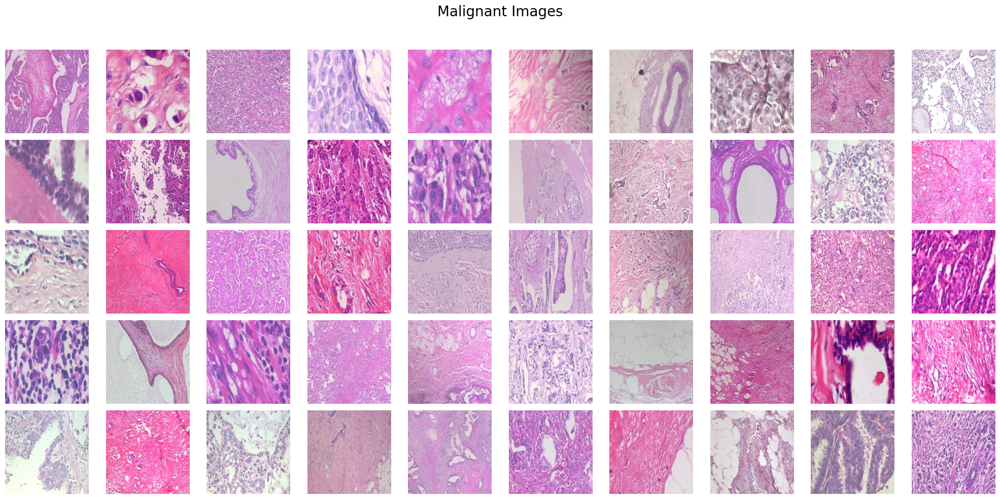

In [11]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

fig.suptitle("Malignant Images", fontsize=20)  

for n in range(5):
    for m in range(10):
        idx = pos_selection[m + 10*n]
        image = imread(test_data.loc[idx, "path"])
        ax[n, m].imshow(image)
        ax[n, m].grid(False)
        ax[n, m].axis('off')  
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

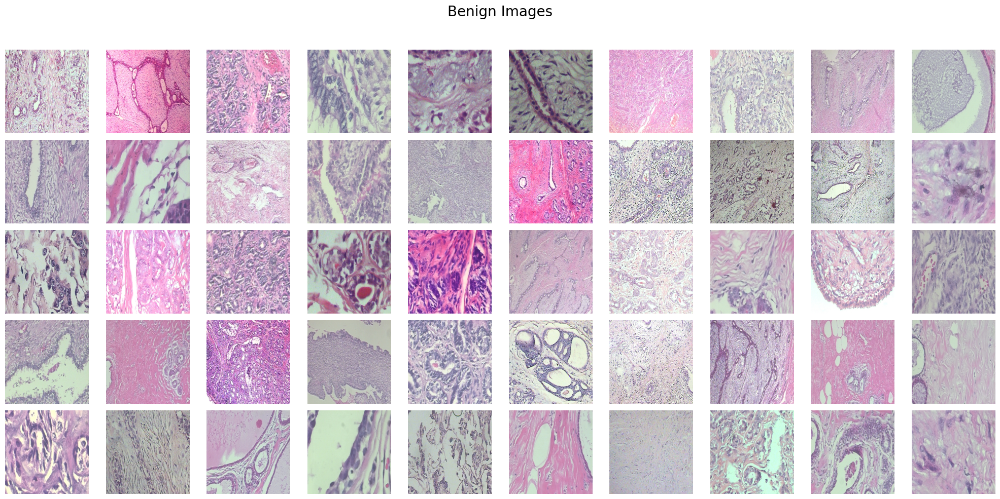

In [12]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

fig.suptitle("Benign Images", fontsize=20)  

for n in range(5):
    for m in range(10):
        idx = neg_selection[m + 10*n]
        image = imread(test_data.loc[idx, "path"])
        ax[n, m].imshow(image)
        ax[n, m].grid(False)
        ax[n, m].axis('off')  
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()

In [13]:
print(test_data['target'].value_counts())


target
1    5429
0    2480
Name: count, dtype: int64


## Merging Both Dataset 

In [14]:

merged_data = pd.concat([train_data, test_data], ignore_index=True)
merged_data = merged_data[['path', 'target']].copy()
merged_data['path'] = merged_data['path'].astype(str)
merged_data['target'] = merged_data['target'].astype(int)

print("Merged size:", len(merged_data))


Merged size: 285433


In [15]:
import numpy as np

malignant_indices = np.random.choice(
    merged_data[merged_data.target == 1].index,
    size=50,
    replace=False
)

benign_indices = np.random.choice(
    merged_data[merged_data.target == 0].index,
    size=50,
    replace=False
)


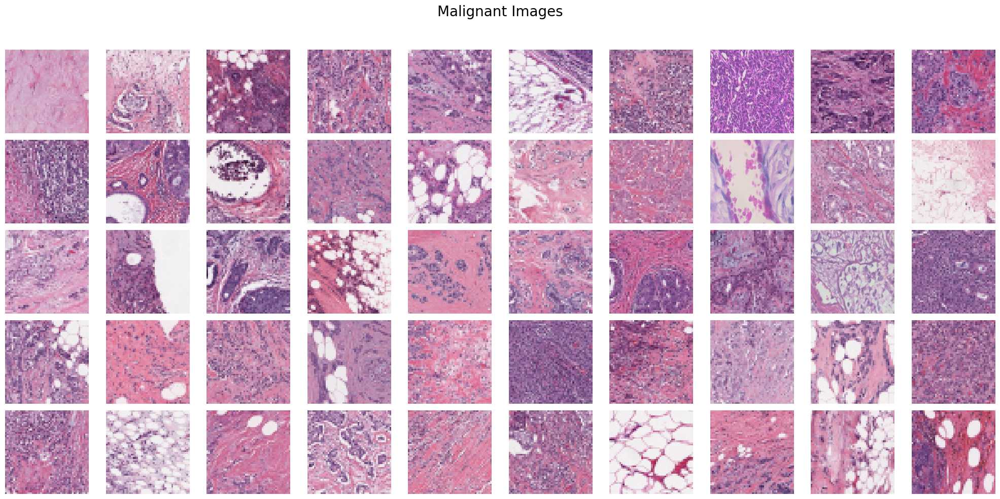

In [16]:
import matplotlib.pyplot as plt
from matplotlib.image import imread

fig, ax = plt.subplots(5, 10, figsize=(20, 10))
fig.suptitle("Malignant Images", fontsize=20)

for i, idx in enumerate(malignant_indices):
    image = imread(merged_data.loc[idx, "path"])
    ax[i//10, i%10].imshow(image)
    ax[i//10, i%10].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


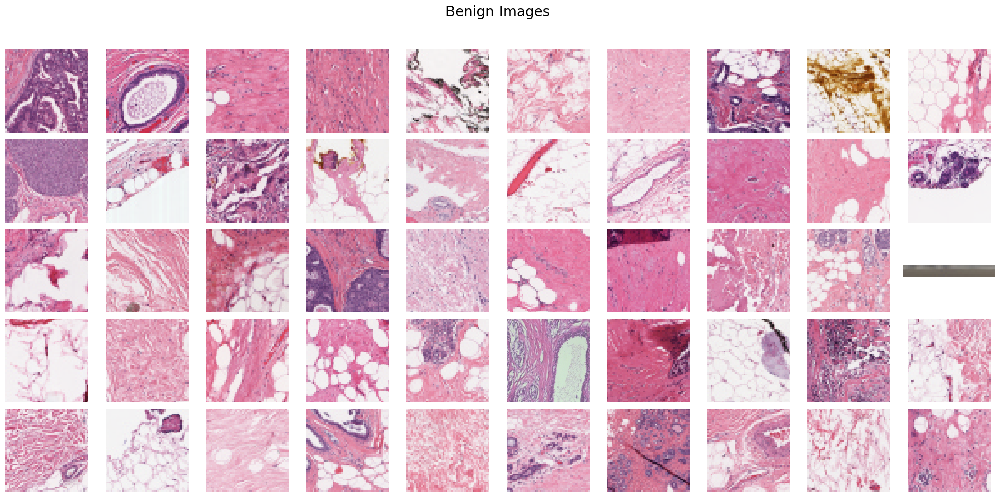

In [17]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))
fig.suptitle("Benign Images", fontsize=20)

for i, idx in enumerate(benign_indices):
    image = imread(merged_data.loc[idx, "path"])
    ax[i//10, i%10].imshow(image)
    ax[i//10, i%10].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


## DATA PREPROCESSING AND LOADING OF TRAIN DATASET

## Shifting To GPU

In [18]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device) 

Using device: cuda


## CREATING CUSTOM DATASET USING PYTORCH FRAMEWORK

In [19]:
import torch, random, numpy as np, os

SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
torch.cuda.manual_seed_all(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


In [20]:
from torch.utils.data import Dataset
from PIL import Image

class BreastCancerDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        path = self.df.loc[idx, "path"]
        label = int(self.df.loc[idx, "target"])

        img = Image.open(path).convert("RGB")
        if self.transform:
            img = self.transform(img)

        return img, label


## Data Augmentation and Tranformation

In [21]:
from torchvision.transforms import v2

TRAIN_TRANSFORM = v2.Compose([
    v2.RandomResizedCrop(224, scale=(0.7, 1.0)),
    v2.RandomHorizontalFlip(),
    v2.RandomVerticalFlip(),
    v2.RandomRotation(20),
    v2.ColorJitter(0.3, 0.3, 0.3, 0.02),
    v2.GaussianBlur(3),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    v2.RandomErasing(p=0.25)
])




In [22]:
EVAL_TRANSFORM = v2.Compose([
    v2.Resize((224, 224)),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

## Train/Test Split


In [23]:
from torch.utils.data import random_split

full_dataset = BreastCancerDataset(merged_data, transform=TRAIN_TRANSFORM)

total = len(full_dataset)
train_size = int(0.70 * total)
val_size   = int(0.15 * total)
test_size  = total - train_size - val_size

generator = torch.Generator().manual_seed(42)
train_subset, val_subset, test_subset = random_split(
    full_dataset, [train_size, val_size, test_size], generator
)

# validation/test use EVAL transforms
val_dataset = BreastCancerDataset(
    merged_data.iloc[val_subset.indices], transform=EVAL_TRANSFORM
)
test_dataset = BreastCancerDataset(
    merged_data.iloc[test_subset.indices], transform=EVAL_TRANSFORM
)




In [24]:
print(f"Training images: {len(train_subset)}")
print(f"Validation images: {len(val_dataset)}")
print(f"Test images: {len(test_dataset)}")

Training images: 199803
Validation images: 42814
Test images: 42816


In [25]:
import torch
from torch.utils.data import WeightedRandomSampler

train_labels = merged_data.iloc[train_subset.indices]["target"].values

counts = {
    0: (train_labels == 0).sum(),
    1: (train_labels == 1).sum()
}
print(counts)

weights = {
    0: 1.0 / counts[0],
    1: 1.0 / counts[1]
}

sample_weights = torch.tensor([weights[l] for l in train_labels], dtype=torch.float32)

sampler = WeightedRandomSampler(
    sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)


{0: 140784, 1: 59019}


## DATALOADER

In [26]:


train_loader = DataLoader(
    train_subset,
    batch_size=64,
    sampler=sampler,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    persistent_workers=True
)



In [27]:
images, labels = next(iter(train_loader))

unique, counts = torch.unique(labels, return_counts=True)
print(dict(zip(unique.tolist(), counts.tolist())))


{0: 35, 1: 29}


## COMPARING AUGMENTED IMAGE AND ORIGINAL IMAGE 

In [28]:
import torch

def denormalize(img_tensor, mean, std):
    mean = torch.tensor(mean).reshape(1, 1, 3)
    std = torch.tensor(std).reshape(1, 1, 3)
    img = img_tensor.permute(1, 2, 0) * std + mean
    return img.clamp(0, 1)


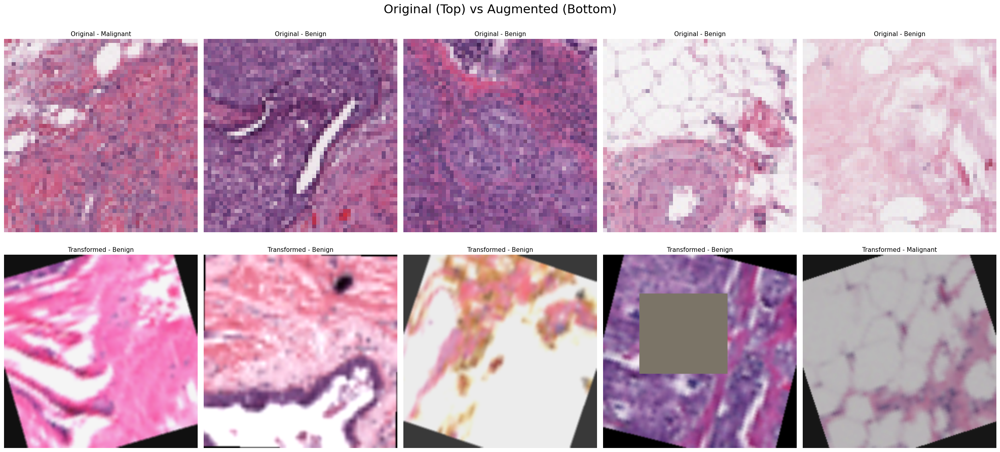

In [29]:
import random
from PIL import Image
import matplotlib.pyplot as plt

# pick 5 random samples from TRAIN dataframe
sample_indices = random.sample(range(len(train_data)), 5)

fig, axes = plt.subplots(2, 5, figsize=(25, 12))

for i, idx in enumerate(sample_indices):

    # ORIGINAL IMAGE PATH
    img_path = train_data.iloc[idx]['path']
    label = train_data.iloc[idx]['target']

    # Read original
    orig = Image.open(img_path).convert("RGB")
    
    axes[0, i].imshow(orig)
    axes[0, i].set_title(f"Original - {'Malignant' if label==1 else 'Benign'}",
                         fontsize=11)
    axes[0, i].axis('off')

# --- NOW SHOW TRANSFORMED IMAGES (AUGMENTED) ---

for i, idx in enumerate(sample_indices):

    # load using train_dataset + transform
    img, label = train_subset[i]     # train_dataset from new pipeline
    
    # convert back to displayable image
    img_np = denormalize(
        img,
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ).numpy()

    axes[1, i].imshow(img_np)
    axes[1, i].set_title(f"Transformed - {'Malignant' if label==1 else 'Benign'}",
                         fontsize=11)
    axes[1, i].axis('off')

plt.suptitle("Original (Top) vs Augmented (Bottom)", fontsize=22)
plt.tight_layout()
plt.show()


## MobileNet Training

In [30]:
from torchvision.models import mobilenet_v2
import torch.nn as nn
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

mobilenet = mobilenet_v2(weights="DEFAULT")
mobilenet.classifier[1] = nn.Linear(1280, 2)

mobilenet = mobilenet.to(device)

# freeze all except last 2 feature blocks
for p in mobilenet.features.parameters():
    p.requires_grad = False
for p in mobilenet.features[-2:].parameters():
    p.requires_grad = True

criterion = nn.CrossEntropyLoss(label_smoothing=0.05)
optimizer = optim.AdamW(
    mobilenet.parameters(),
    lr=5e-4,
    weight_decay=1e-4
)

scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=15)
scaler = torch.amp.GradScaler("cuda")


In [31]:
from tqdm import tqdm

EPOCHS = 15
best_val = 0
patience = 4
trigger = 0

for epoch in range(EPOCHS):
    mobilenet.train()
    correct = total = 0
    running_loss = 0

    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}")

    for images, labels in loop:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        
        with torch.amp.autocast("cuda"):
            outputs = mobilenet(images)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    train_acc = correct / total
    train_loss = running_loss / total

    # validation
    mobilenet.eval()
    val_correct = val_total = 0
    val_loss_sum = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)

            with torch.amp.autocast("cuda"):
                outputs = mobilenet(images)
                loss = criterion(outputs, labels)

            val_loss_sum += loss.item() * labels.size(0)
            val_correct += (outputs.argmax(1) == labels).sum().item()
            val_total += labels.size(0)

    val_loss = val_loss_sum / val_total
    val_acc = val_correct / val_total

    scheduler.step()

    print(f"Epoch {epoch+1}/{EPOCHS} | "
          f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f}")

    if val_acc > best_val:
        best_val = val_acc
        torch.save(mobilenet.state_dict(), "mobilenet_best.pth")
        print("  ✅ Saved best model")
        trigger = 0
    else:
        trigger += 1
        if trigger >= patience:
            print(" Early stopping!")
            break


Epoch 1/15: 100%|██████████| 3122/3122 [24:11<00:00,  2.15it/s]


Epoch 1/15 | Train Acc: 0.8368 | Val Acc: 0.8505
  ✅ Saved best model


Epoch 2/15: 100%|██████████| 3122/3122 [25:02<00:00,  2.08it/s]


Epoch 2/15 | Train Acc: 0.8505 | Val Acc: 0.8585
  ✅ Saved best model


Epoch 3/15: 100%|██████████| 3122/3122 [23:50<00:00,  2.18it/s]


Epoch 3/15 | Train Acc: 0.8526 | Val Acc: 0.8778
  ✅ Saved best model


Epoch 4/15: 100%|██████████| 3122/3122 [23:11<00:00,  2.24it/s]


Epoch 4/15 | Train Acc: 0.8556 | Val Acc: 0.8685


Epoch 5/15: 100%|██████████| 3122/3122 [22:51<00:00,  2.28it/s]


Epoch 5/15 | Train Acc: 0.8612 | Val Acc: 0.8623


Epoch 6/15: 100%|██████████| 3122/3122 [23:50<00:00,  2.18it/s]


Epoch 6/15 | Train Acc: 0.8619 | Val Acc: 0.8686


Epoch 7/15: 100%|██████████| 3122/3122 [21:59<00:00,  2.37it/s]


Epoch 7/15 | Train Acc: 0.8623 | Val Acc: 0.8633
 Early stopping!


## CROSSDATASET TESTING

In [37]:
mobilenet.load_state_dict(torch.load("mobilenet_best.pth", map_location=device))
mobilenet.eval()
test_correct, test_total = 0, 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = mobilenet(images)
        _, predicted = torch.max(outputs, 1)
        test_correct += (predicted == labels).sum().item()
        test_total += labels.size(0)

test_acc = test_correct / test_total
print(f"\nTest Accuracy on test-dataset: {test_acc:.4f}")



Test Accuracy on test-dataset: 0.8762


In [38]:
from tqdm import tqdm

all_preds = []
all_labels = []

mobilenet.eval()
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc="Testing"):
        images, labels = images.to(device), labels.to(device)
        outputs = mobilenet(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

Testing: 100%|██████████| 669/669 [01:27<00:00,  7.63it/s]


In [40]:
# !ls /kaggle/working


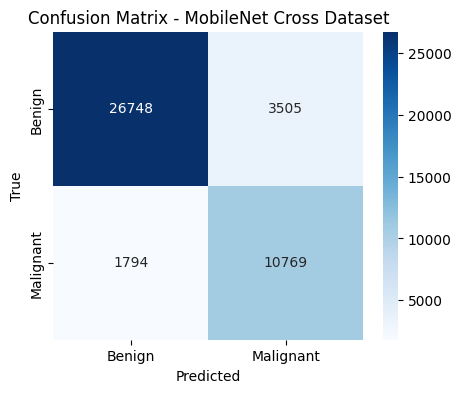


Classification Report:

              precision    recall  f1-score   support

      Benign       0.94      0.88      0.91     30253
   Malignant       0.75      0.86      0.80     12563

    accuracy                           0.88     42816
   macro avg       0.85      0.87      0.86     42816
weighted avg       0.88      0.88      0.88     42816



In [39]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - MobileNet Cross Dataset')
plt.show()

print("\nClassification Report:\n")
print(classification_report(all_labels, all_preds, target_names=['Benign', 'Malignant']))
